In [1]:
import os
import time
import datetime
import pickle
import numpy as np
import pandas as pd
import seaborn as sns
import pandas_profiling as pdp
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, KFold
from sklearn.cluster import KMeans # K-means クラスタリングをおこなう
%matplotlib inline

In [2]:
date = datetime.datetime.today().strftime("%Y%m%d_%H%M%S")
train = pd.read_csv("../input/train.csv")
test = pd.read_csv("../input/test.csv")
train_geo = pd.read_csv("../add_input/train_geocode.csv")
test_geo = pd.read_csv("../add_input/test_geocode.csv")

train = train.rename(columns={'賃料': 'target', '契約期間': 'Contract', '間取り': 'Room',
                              '築年数': 'Passed', '駐車場': 'Parking', '室内設備': 'Facility',
                              '放送・通信': 'Internet', '周辺環境': 'Building', '建物構造': 'Material',
                              '面積': 'Area', 'キッチン': 'Kitchen', '所在地': 'Place',
                              'バス・トイレ': 'Bath', '所在階': 'Floor', 'アクセス': 'Access',
                              '方角': 'Angle'})
test = test.rename(columns={'契約期間': 'Contract', '間取り': 'Room', '築年数': 'Passed',
                            '駐車場': 'Parking', '室内設備': 'Facility', '放送・通信': 'Internet',
                            '周辺環境': 'Building', '建物構造': 'Material', '面積': 'Area',
                            'キッチン': 'Kitchen', '所在地': 'Place', 'バス・トイレ': 'Bath',
                            '所在階': 'Floor', 'アクセス': 'Access', '方角': 'Angle'})
# geocoding結果を結合
train["Latitude"] = train_geo["latitude"]
train["Longitude"] = train_geo["longitude"]
test["Latitude"] = test_geo["latitude"]
test["Longitude"] = test_geo["longitude"]

# 外れ値除去&修正
train.drop(train.query("id==20428 or id == 20232").index, inplace=True)  # 築年数が異常に大きい
train.drop(train.query("id==20927").index, inplace=True)  # 面積あたりの価格が安すぎる（荒川区）
train.drop(train.query("id==7492").index, inplace=True)  # 面積あたりの価格が高すぎる(豊島区)
train.drop(train.query("id==5776").index, inplace=True)  # 価格の桁が1つ多い(港区)
# train.query("id==5776")["target"] /= 10  # 価格の桁が1つ多い(港区)

In [3]:
test[test["Latitude"]==0]

,id,Place,Access,Room,Passed,Angle,Area,Floor,Bath,Kitchen,Internet,Facility,Parking,Building,Material,Contract,Latitude,Longitude


In [4]:
train["Longitude"]

0        139.731274
1        139.779746
2        139.670561
3        139.648465
4        139.872321
            ...    
31465    139.679413
31466    139.668082
31467    139.826978
31468    139.671598
31469    139.694408
Name: Longitude, Length: 31465, dtype: float64

/Users/kyohei/kenv/lib/python3.7/site-packages/seaborn/distributions.py:423: UserWarning: The following kwargs were not used by contour: 'xlim', 'ylim'
  cset = contour_func(xx, yy, z, n_levels, **kwargs)


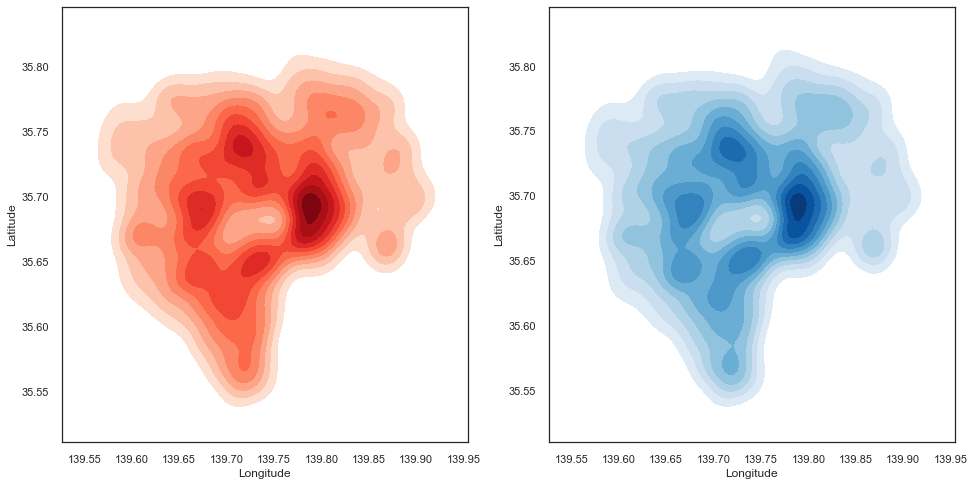

In [5]:
sns.set(style="white")

train_lat = train["Latitude"]
train_long = train["Longitude"]

test_lat = test["Latitude"]
test_long = test["Longitude"]

# Set up the figure
fig= plt.figure(figsize=(16, 8))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
# ax.set_aspect("equal")

# Draw the two density plots
sns.kdeplot(train_long, train_lat, cmap="Reds", shade=True, shade_lowest=False, ax=ax1, xlim=(139.5, 140), ylim=(35.5, 35.9), label="train")
sns.kdeplot(test_long, test_lat, cmap="Blues", shade=True,  shade_lowest=False, ax=ax2, xlim=(139.5, 140), ylim=(35.5, 35.9), label="test")
# axes.set_ylim(35.5, 35.9)
# axes.set_xlim(139.5, 140)

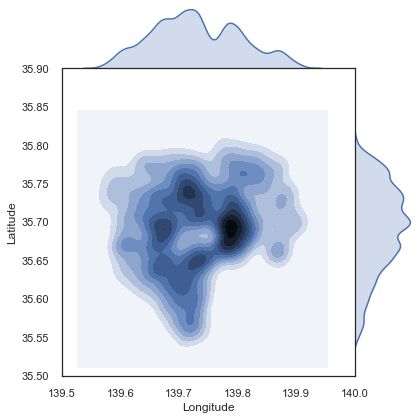

In [6]:
sns.jointplot(train_long, train_lat, kind="kde", xlim=(139.5, 140), ylim=(35.5, 35.9), space=0)

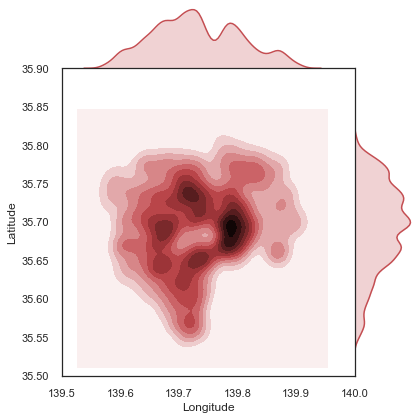

In [7]:
sns.jointplot(test_long, test_lat, kind="kde", color="r", xlim=(139.5, 140), ylim=(35.5, 35.9), space=0)

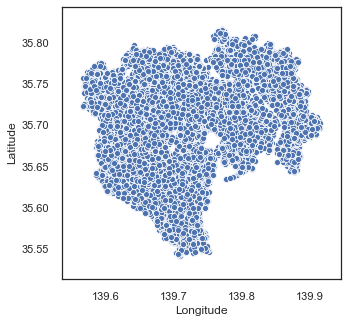

In [9]:
fig = plt.figure(figsize=(5, 5))
sns.scatterplot(x=train_long, y=train_lat)

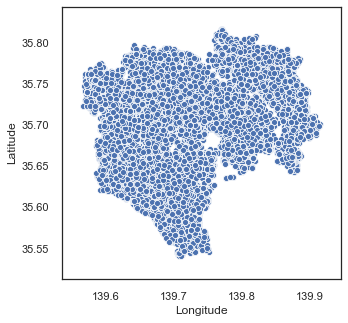

In [10]:
fig = plt.figure(figsize=(5, 5))
sns.scatterplot(x=test_long, y=test_lat)

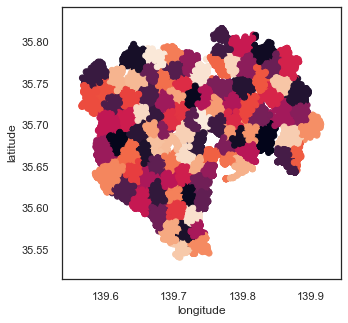

In [11]:
train = pd.concat([train_lat, train_long], axis=1)
kmeans_model = KMeans(n_clusters=100, random_state=0)
kmeans_model.fit(train)
train_pred = kmeans_model.predict(train)
fig = plt.figure(figsize=(5, 5))
ax = fig.add_subplot(111)
plt.scatter(train_long, train_lat, c=train_pred)
ax.set_xlabel("longitude")
ax.set_ylabel("latitude")
plt.show()

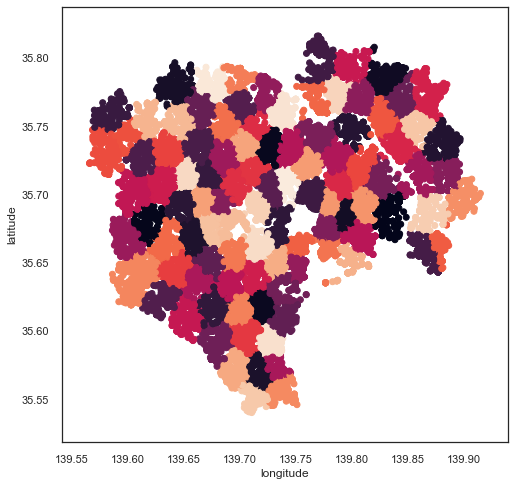

In [21]:
test = pd.concat([test_lat, test_long], axis=1)
test_pred = kmeans_model.predict(test)
fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111)
plt.scatter(test_long, test_lat, c=test_pred)
ax.set_xlabel("longitude")
ax.set_ylabel("latitude")
plt.show()